In [ ]:
!git clone https://github.com/seraj94ai/Self-driving

Cloning into 'Self-driving'...
remote: Enumerating objects: 15199, done.
remote: Total 15199 (delta 0), reused 0 (delta 0), pack-reused 15199 (from 1)
Receiving objects: 100% (15199/15199), 230.23 MiB | 14.96 MiB/s, done.
Resolving deltas: 100% (63/63), done.
Updating files: 100% (15568/15568), done.


In [ ]:
!ls track

ls: cannot access 'track': No such file or directory


In [ ]:
!pip3 install imgaug

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
# Mengatur path ke direktori data yang menyimpan file driving_log.csv
datadir = 'Self-driving'

# Menetapkan nama kolom sesuai dengan data yang disimpan di file CSV
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

# Membaca data dari file driving_log.csv menggunakan pandas
# File ini kemungkinan berisi informasi seperti jalur gambar dari kamera (center, left, right)
# serta data kontrol kendaraan seperti steering (kemudi), throttle (gas), reverse (mundur), dan speed (kecepatan)
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)

# Mengatur opsi pandas untuk menampilkan seluruh isi kolom, khususnya yang memiliki teks panjang (misalnya jalur file)
pd.set_option('display.max_colwidth', None)  # None digunakan untuk menghilangkan batas maksimum lebar kolom

# Menampilkan 5 baris pertama dari data yang dimuat untuk melihat isinya
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_553.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_553.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_553.jpg,0.0,0.0,0.0,1.889167
1,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_707.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_707.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_707.jpg,0.0,0.0,0.0,1.858934
2,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_821.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_821.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_821.jpg,0.0,0.0,0.0,1.836577
3,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_966.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_966.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_966.jpg,0.0,0.0,0.0,1.810833
4,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_57_080.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_57_080.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_57_080.jpg,0.0,0.0,0.0,1.789054


In [ ]:
# Fungsi untuk mendapatkan bagian akhir (nama file) dari sebuah path
def path_leaf(path):
    # ntpath.split() akan memisahkan path menjadi dua bagian: head dan tail
    # head adalah direktori, tail adalah nama file
    head, tail = ntpath.split(path)
    return tail  # Mengembalikan hanya nama file (tail) tanpa direktori

# Menerapkan fungsi path_leaf ke kolom 'center' untuk mendapatkan hanya nama file
data['center'] = data['center'].apply(path_leaf)

# Menerapkan fungsi yang sama ke kolom 'left' untuk mendapatkan hanya nama file
data['left'] = data['left'].apply(path_leaf)

# Menerapkan fungsi yang sama ke kolom 'right' untuk mendapatkan hanya nama file
data['right'] = data['right'].apply(path_leaf)

# Menampilkan 5 baris pertama dari data yang dimodifikasi untuk memverifikasi hasil
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2019_02_23_20_23_56_553.jpg,left_2019_02_23_20_23_56_553.jpg,right_2019_02_23_20_23_56_553.jpg,0.0,0.0,0.0,1.889167
1,center_2019_02_23_20_23_56_707.jpg,left_2019_02_23_20_23_56_707.jpg,right_2019_02_23_20_23_56_707.jpg,0.0,0.0,0.0,1.858934
2,center_2019_02_23_20_23_56_821.jpg,left_2019_02_23_20_23_56_821.jpg,right_2019_02_23_20_23_56_821.jpg,0.0,0.0,0.0,1.836577
3,center_2019_02_23_20_23_56_966.jpg,left_2019_02_23_20_23_56_966.jpg,right_2019_02_23_20_23_56_966.jpg,0.0,0.0,0.0,1.810833
4,center_2019_02_23_20_23_57_080.jpg,left_2019_02_23_20_23_57_080.jpg,right_2019_02_23_20_23_57_080.jpg,0.0,0.0,0.0,1.789054


total data: 5186


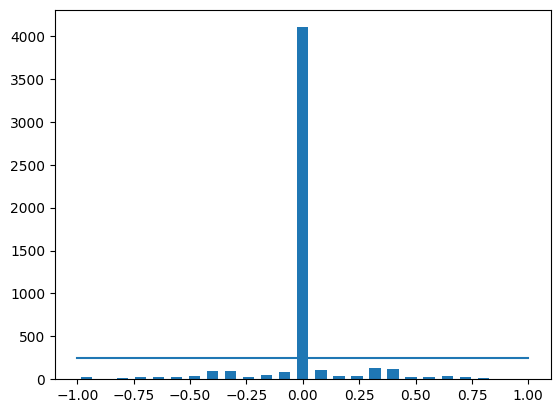

In [ ]:
# Menetapkan jumlah bin untuk histogram
num_bins = 25

# Menetapkan jumlah sampel maksimum per bin untuk plot batas distribusi data
samples_per_bin = 250

# Membuat histogram dari data kolom 'steering' untuk melihat distribusi nilai kemudi
# hist: jumlah sampel dalam setiap bin, bins: batas dari setiap bin
hist, bins = np.histogram(data['steering'], num_bins)

# Menghitung nilai tengah (center) dari setiap bin untuk menempatkan bar histogram
center = (bins[:-1] + bins[1:]) * 0.5  # Mengambil rata-rata dari setiap pasangan batas bin

# Membuat plot histogram menggunakan bar plot
plt.bar(center, hist, width=0.05)  # width: lebar bar untuk setiap bin

# Menggambar garis horizontal pada jumlah sampel yang diinginkan per bin
# Garis ini menunjukkan batas untuk 250 sampel per bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

# Menampilkan total jumlah data yang tersedia dalam dataset
print('total data:', len(data))

removed: 3851
remaining: 1335


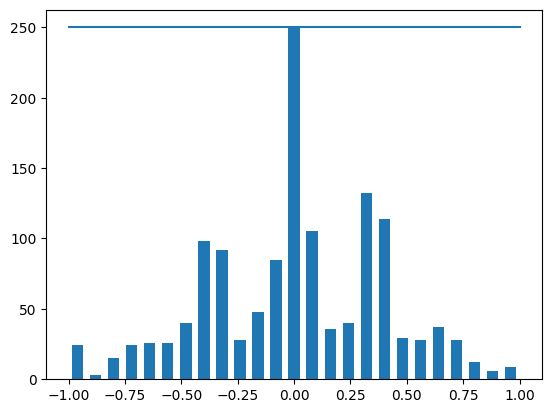

In [ ]:
# Inisialisasi list kosong untuk menyimpan indeks yang akan dihapus
remove_list = []

# Looping melalui setiap bin dalam histogram
for j in range(num_bins):
    # Membuat list kosong untuk menyimpan indeks data yang ada di dalam bin ke-j
    list_ = []

    # Iterasi melalui seluruh data untuk mengecek apakah nilai steering ada dalam bin
    for i in range(len(data['steering'])):
        # Jika nilai steering berada di antara batas bawah (bins[j]) dan batas atas (bins[j+1]) dari bin ke-j
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)  # Simpan indeks data ke dalam list_ jika sesuai

    # Acak urutan list_ (indeks data) agar penghapusan acak
    list_ = shuffle(list_)

    # Hanya ambil sampel di luar batas yang diizinkan (samples_per_bin), yaitu mulai dari indeks ke-250
    list_ = list_[samples_per_bin:]

    # Tambahkan indeks yang akan dihapus ke remove_list
    remove_list.extend(list_)

# Menampilkan jumlah sampel yang akan dihapus
print('removed:', len(remove_list))

# Menghapus data yang berada dalam remove_list (berlebihan di setiap bin) dari DataFrame
data.drop(data.index[remove_list], inplace=True)

# Menampilkan jumlah data yang tersisa setelah penghapusan
print('remaining:', len(data))

# Membuat histogram baru dari data 'steering' yang tersisa setelah penghapusan
hist, _ = np.histogram(data['steering'], (num_bins))

# Membuat bar plot dari histogram yang baru
plt.bar(center, hist, width=0.05)

# Menggambar garis horizontal yang menunjukkan batas maksimum sampel per bin (250 sampel)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
# Menampilkan baris pertama dari DataFrame untuk melihat konten secara detail
print(data.iloc[1])

# Fungsi untuk memuat jalur gambar dan nilai steering dari DataFrame
def load_img_steering(datadir, df):
    # Inisialisasi list untuk menyimpan jalur gambar dan nilai steering
    image_path = []
    steering = []

    # Looping untuk setiap baris dalam DataFrame
    for i in range(len(data)):
        # Mengambil data dari baris ke-i
        indexed_data = data.iloc[i]
        # Mendapatkan path gambar dari kolom center, left, dan right
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

        # Menambahkan jalur gambar dari kamera tengah (center) dan nilai steering terkait
        image_path.append(os.path.join(datadir, center.strip()))  # Menggabungkan direktori dengan nama file dan menghapus spasi
        steering.append(float(indexed_data[3]))  # Menambahkan nilai steering

        # Menambahkan jalur gambar dari kamera kiri (left) dan menambahkan 0.15 ke nilai steering
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data[3]) + 0.15)  # Menambah bias untuk gambar dari kamera kiri

        # Menambahkan jalur gambar dari kamera kanan (right) dan mengurangi 0.15 dari nilai steering
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data[3]) - 0.15)  # Mengurangi bias untuk gambar dari kamera kanan

    # Mengonversi list jalur gambar dan nilai steering menjadi array numpy
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)

    # Mengembalikan array jalur gambar dan array nilai steering
    return image_paths, steerings

center      center_2019_02_23_20_23_57_229.jpg
left          left_2019_02_23_20_23_57_229.jpg
right        right_2019_02_23_20_23_57_229.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                 1.763976
Name: 5, dtype: object


<ipython-input-13-535b6a39c6a2>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-13-535b6a39c6a2>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-13-535b6a39c6a2>:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3])+0.15)
<ipython-input-13-535b6a39c6a2>:15:

Training Samples: 3204
Valid Samples: 801


Text(0.5, 1.0, 'Validation set')

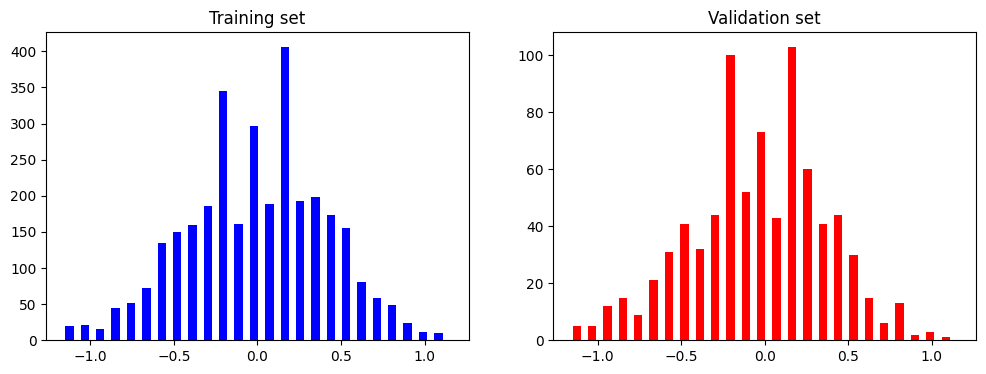

In [ ]:
# Memuat jalur gambar dan nilai steering dari fungsi load_img_steering
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

# Membagi data menjadi set pelatihan (train) dan validasi (validasi)
# test_size=0.2 berarti 20% dari data digunakan sebagai set validasi, 80% sisanya digunakan untuk pelatihan
# random_state=6 memastikan bahwa pembagian data bisa direproduksi setiap kali dijalankan
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

# Menampilkan jumlah sampel pada set pelatihan dan validasi
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

# Membuat subplot dengan 2 kolom untuk memvisualisasikan distribusi steering pada set pelatihan dan validasi
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Membuat histogram dari nilai steering pada set pelatihan
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')  # Menetapkan judul pada plot pelatihan

# Membuat histogram dari nilai steering pada set validasi
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')  # Menetapkan judul pada plot validasi

In [ ]:
# Fungsi untuk menerapkan augmentasi zoom pada gambar
def zoom(image):
    # Menggunakan augmentasi dari library imgaug untuk memperbesar gambar
    # iaa.Affine(scale=(1, 1.3)) berarti gambar akan diubah skalanya secara acak antara 1x (asli) dan 1.3x (maksimal zoom)
    zoom = iaa.Affine(scale=(1, 1.3))

    # Menerapkan transformasi zoom pada gambar
    image = zoom.augment_image(image)

    # Mengembalikan gambar yang sudah di-augmentasi
    return image

Text(0.5, 1.0, 'Zoomed Image')

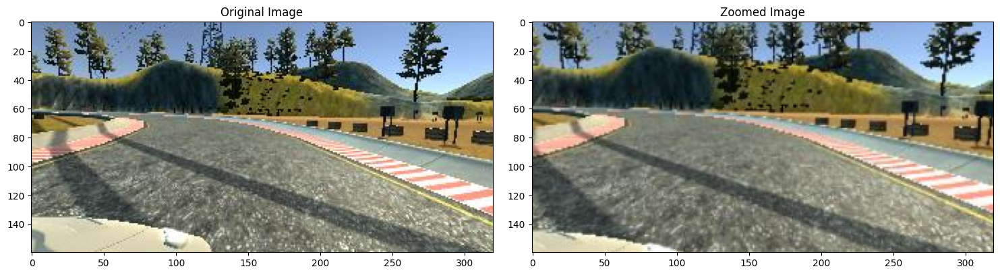

In [ ]:
# Memilih gambar secara acak dari list image_paths, dengan indeks acak antara 0 hingga 1000
image = image_paths[random.randint(0, 1000)]

# Membaca gambar asli menggunakan matplotlib.image.imread
original_image = mpimg.imread(image)

# Menerapkan fungsi zoom untuk melakukan augmentasi (zoom in) pada gambar asli
zoomed_image = zoom(original_image)

# Membuat figure dengan 2 subplot (satu untuk gambar asli, satu untuk gambar hasil zoom)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # Membuat 2 subplot dalam satu baris

# Menyelaraskan layout agar tidak ada elemen yang tumpang tindih
fig.tight_layout()

# Menampilkan gambar asli pada subplot pertama
axs[0].imshow(original_image)
axs[0].set_title('Original Image')  # Memberikan judul pada subplot pertama

# Menampilkan gambar hasil augmentasi zoom pada subplot kedua
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')  # Memberikan judul pada subplot kedua

In [ ]:
# Fungsi untuk melakukan augmentasi "panning" (pergeseran) pada gambar
def pan(image):
    # Menggunakan augmentasi dari library imgaug untuk menggeser gambar (panning)
    # translate_percent menggeser gambar secara acak dalam persentase tertentu dari dimensi gambar
    # {"x": (-0.1, 0.1)} berarti gambar akan digeser secara horizontal hingga 10% dari lebarnya
    # {"y": (-0.1, 0.1)} berarti gambar akan digeser secara vertikal hingga 10% dari tingginya
    pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})

    # Menerapkan transformasi panning pada gambar
    image = pan.augment_image(image)

    # Mengembalikan gambar yang sudah di-augmentasi
    return image

Text(0.5, 1.0, 'Panned Image')

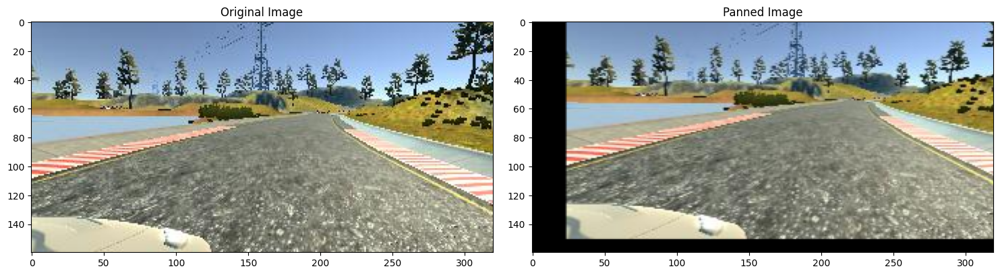

In [ ]:
# Memilih gambar secara acak dari daftar image_paths, dengan indeks acak antara 0 hingga 1000
image = image_paths[random.randint(0, 1000)]

# Membaca gambar asli menggunakan matplotlib.image.imread
original_image = mpimg.imread(image)

# Menerapkan fungsi pan untuk melakukan augmentasi panning pada gambar asli
panned_image = pan(original_image)

# Membuat figure dengan 2 subplot (satu untuk gambar asli, satu untuk gambar hasil panning)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # Membuat 2 subplot dalam satu baris

# Menyelaraskan layout agar tidak ada elemen yang tumpang tindih
fig.tight_layout()

# Menampilkan gambar asli pada subplot pertama
axs[0].imshow(original_image)
axs[0].set_title('Original Image')  # Memberikan judul pada subplot pertama

# Menampilkan gambar hasil augmentasi panning pada subplot kedua
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')  # Memberikan judul pada subplot kedua

In [ ]:
# Fungsi untuk melakukan augmentasi random brightness (kecerahan acak) pada gambar
def img_random_brightness(image):
    # Menggunakan augmentasi dari library imgaug untuk mengubah kecerahan gambar
    # iaa.Multiply((0.2, 1.2)) berarti gambar akan dikalikan dengan faktor antara 0.2 (lebih gelap)
    # hingga 1.2 (lebih terang)
    brightness = iaa.Multiply((0.2, 1.2))

    # Menerapkan transformasi perubahan kecerahan pada gambar
    image = brightness.augment_image(image)

    # Mengembalikan gambar yang sudah di-augmentasi
    return image

Text(0.5, 1.0, 'Brightness altered image ')

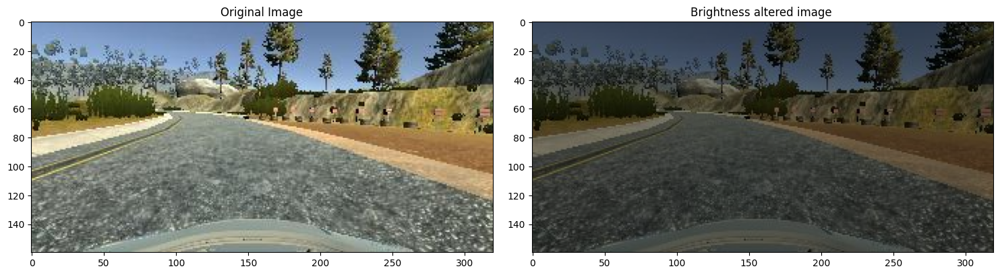

In [ ]:
# Memilih gambar secara acak dari daftar image_paths dengan indeks acak antara 0 hingga 1000
image = image_paths[random.randint(0, 1000)]

# Membaca gambar asli menggunakan matplotlib.image.imread
original_image = mpimg.imread(image)

# Menerapkan fungsi img_random_brightness untuk mengubah kecerahan gambar
brightness_altered_image = img_random_brightness(original_image)

# Membuat figure dengan 2 subplot (satu untuk gambar asli, satu untuk gambar yang telah diubah kecerahannya)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # Membuat 2 subplot dalam satu baris

# Menyelaraskan layout agar tidak ada elemen yang tumpang tindih
fig.tight_layout()

# Menampilkan gambar asli pada subplot pertama
axs[0].imshow(original_image)
axs[0].set_title('Original Image')  # Memberikan judul pada subplot pertama

# Menampilkan gambar dengan kecerahan yang telah diubah pada subplot kedua
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image')  # Memberikan judul pada subplot kedua

In [ ]:
# Fungsi untuk melakukan augmentasi flip horizontal pada gambar dan membalikkan sudut kemudi
def img_random_flip(image, steering_angle):
    # Menerapkan flip horizontal pada gambar menggunakan OpenCV
    # cv2.flip(image, 1) melakukan flip horizontal (1) pada gambar
    image = cv2.flip(image, 1)

    # Membalikkan nilai sudut kemudi (steering_angle)
    # Jika gambar dibalik, arah kemudi juga harus dibalik (negatif)
    steering_angle = -steering_angle

    # Mengembalikan gambar yang telah di-flip dan sudut kemudi yang telah dibalik
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.773772')

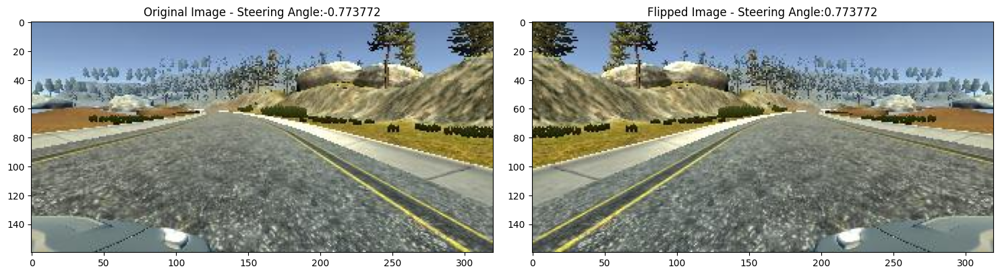

In [ ]:
# Mengambil indeks acak dari 0 hingga 1000 untuk memilih gambar dan sudut kemudi yang terkait
random_index = random.randint(0, 1000)

# Mengambil jalur gambar dan sudut kemudi menggunakan indeks acak
image = image_paths[random_index]
steering_angle = steerings[random_index]

# Membaca gambar asli menggunakan matplotlib.image.imread
original_image = mpimg.imread(image)

# Menerapkan fungsi img_random_flip untuk membalik gambar dan mendapatkan sudut kemudi yang telah dibalik
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

# Membuat figure dengan 2 subplot (satu untuk gambar asli, satu untuk gambar yang telah dibalik)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # Membuat 2 subplot dalam satu baris

# Menyelaraskan layout agar tidak ada elemen yang tumpang tindih
fig.tight_layout()

# Menampilkan gambar asli pada subplot pertama
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle: ' + str(steering_angle))  # Menambahkan judul yang menunjukkan sudut kemudi

# Menampilkan gambar yang telah dibalik pada subplot kedua
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle: ' + str(flipped_steering_angle))  # Menambahkan judul dengan sudut kemudi yang telah dibalik

In [ ]:
# Fungsi untuk menerapkan augmentasi acak pada gambar dan sudut kemudi
def random_augment(image, steering_angle):
    # Membaca gambar dari jalur yang diberikan
    image = mpimg.imread(image)

    # Menggunakan probabilitas untuk menerapkan augmentasi panning
    if np.random.rand() < 0.5:
        image = pan(image)  # Menerapkan augmentasi panning jika acak menghasilkan < 0.5

    # Menggunakan probabilitas untuk menerapkan augmentasi zoom
    if np.random.rand() < 0.5:
        image = zoom(image)  # Menerapkan augmentasi zoom jika acak menghasilkan < 0.5

    # Menggunakan probabilitas untuk menerapkan augmentasi perubahan kecerahan
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)  # Menerapkan augmentasi kecerahan jika acak menghasilkan < 0.5

    # Menggunakan probabilitas untuk menerapkan flip pada gambar dan membalik sudut kemudi
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)  # Menerapkan flip jika acak menghasilkan < 0.5

    # Mengembalikan gambar yang telah di-augmentasi dan sudut kemudi yang sesuai
    return image, steering_angle

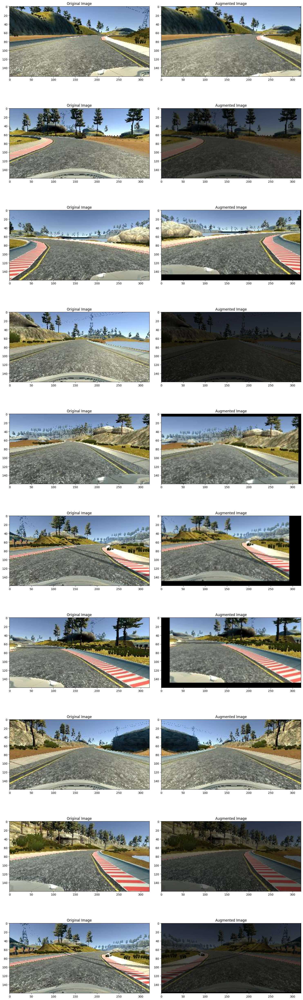

In [ ]:
# Menetapkan jumlah kolom dan baris untuk grid plot
ncol = 2  # Jumlah kolom
nrow = 10  # Jumlah baris

# Membuat figure dengan subplots berdasarkan jumlah baris dan kolom yang ditetapkan
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))  # Ukuran figure adalah 15x50
fig.tight_layout()  # Mengatur layout figure agar tidak ada elemen yang tumpang tindih

# Loop untuk menghasilkan 10 contoh gambar acak
for i in range(10):
    # Mengambil indeks acak dari daftar image_paths
    randnum = random.randint(0, len(image_paths) - 1)

    # Mengambil jalur gambar dan sudut kemudi yang sesuai menggunakan indeks acak
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    # Membaca gambar asli menggunakan matplotlib.image.imread
    original_image = mpimg.imread(random_image)

    # Menerapkan fungsi random_augment pada gambar dan sudut kemudi
    augmented_image, steering = random_augment(random_image, random_steering)

    # Menampilkan gambar asli pada subplot kiri
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")  # Menetapkan judul untuk gambar asli

    # Menampilkan gambar yang telah di-augmentasi pada subplot kanan
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")  # Menetapkan judul untuk gambar yang telah di-augmentasi

In [ ]:
# Fungsi untuk melakukan preprocessing pada gambar sebelum digunakan dalam model
def img_preprocess(img):
    # Memotong gambar untuk mengambil area yang relevan (menghapus bagian atas dan bawah)
    # Mengambil bagian gambar dari baris ke-60 hingga ke-135
    img = img[60:135, :, :]

    # Mengubah ruang warna dari RGB ke YUV
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

    # Menerapkan Gaussian Blur untuk mengurangi noise pada gambar
    # Ukuran kernel blur adalah (3, 3) dan sigma (0) untuk standar deviasi
    img = cv2.GaussianBlur(img, (3, 3), 0)

    # Mengubah ukuran gambar menjadi (200, 66) piksel
    # Ini mengubah dimensi gambar agar sesuai dengan input model
    img = cv2.resize(img, (200, 66))

    # Normalisasi nilai piksel dengan membagi dengan 255
    # Ini mengubah rentang piksel dari 0-255 menjadi 0-1
    img = img / 255

    # Mengembalikan gambar yang sudah diproses
    return img

Text(0.5, 1.0, 'Preprocessed Image')

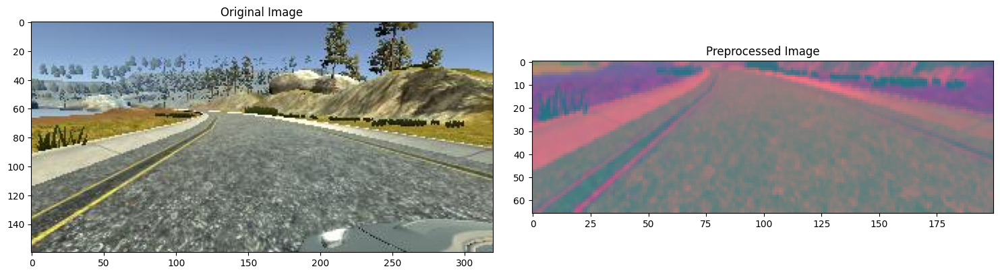

In [ ]:
# Mengambil jalur gambar dari image_paths pada indeks 100
image = image_paths[100]

# Membaca gambar asli menggunakan matplotlib.image.imread
original_image = mpimg.imread(image)

# Menerapkan fungsi img_preprocess untuk memproses gambar asli
preprocessed_image = img_preprocess(original_image)

# Membuat figure dengan 2 subplot (satu untuk gambar asli, satu untuk gambar yang sudah diproses)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # Ukuran figure adalah 15x10
fig.tight_layout()  # Mengatur layout agar tidak ada elemen yang tumpang tindih

# Menampilkan gambar asli pada subplot pertama
axs[0].imshow(original_image)
axs[0].set_title('Original Image')  # Menetapkan judul pada subplot pertama

# Menampilkan gambar yang telah diproses pada subplot kedua
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')  # Menetapkan judul pada subplot kedua

In [ ]:
# Fungsi untuk menghasilkan batch data untuk pelatihan model
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    # Menghasilkan batch data secara terus-menerus
    while True:
        batch_img = []  # List untuk menyimpan gambar dalam batch
        batch_steering = []  # List untuk menyimpan sudut kemudi dalam batch

        # Mengisi batch dengan data
        for i in range(batch_size):
            # Memilih indeks acak untuk mengambil gambar dan sudut kemudi
            random_index = random.randint(0, len(image_paths) - 1)

            # Jika dalam mode pelatihan, terapkan augmentasi acak
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                # Jika tidak dalam mode pelatihan, baca gambar tanpa augmentasi
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            # Proses gambar sebelum menambahkannya ke batch
            im = img_preprocess(im)
            batch_img.append(im)  # Menambahkan gambar ke batch
            batch_steering.append(steering)  # Menambahkan sudut kemudi ke batch

        # Menghasilkan batch gambar dan sudut kemudi sebagai numpy array
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

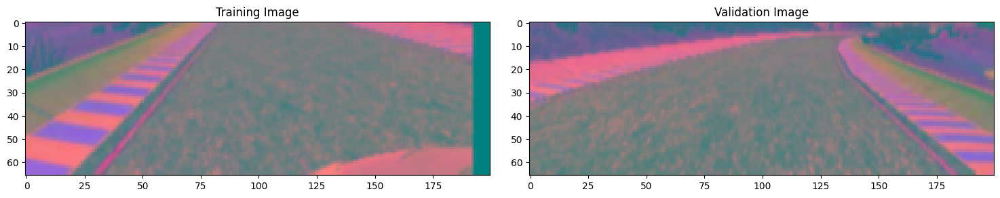

In [ ]:
# Menggunakan batch_generator untuk mengambil satu batch dari data pelatihan
# istraining diatur ke 1 untuk menunjukkan mode pelatihan
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))

# Menggunakan batch_generator untuk mengambil satu batch dari data validasi
# istraining diatur ke 0 untuk menunjukkan mode validasi
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

# Membuat figure dengan 2 subplot (satu untuk gambar pelatihan, satu untuk gambar validasi)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # Ukuran figure adalah 15x10
fig.tight_layout()  # Mengatur layout agar tidak ada elemen yang tumpang tindih

# Menampilkan gambar dari batch pelatihan pada subplot pertama
axs[0].imshow(x_train_gen[0])  # Mengambil gambar pertama dari batch pelatihan
axs[0].set_title('Training Image')  # Menetapkan judul pada subplot pertama

# Menampilkan gambar dari batch validasi pada subplot kedua
axs[1].imshow(x_valid_gen[0])  # Mengambil gambar pertama dari batch validasi
axs[1].set_title('Validation Image')  # Menetapkan judul pada subplot kedua

In [ ]:
# Mengimpor modul yang diperlukan dari Keras
from keras.models import Sequential
from keras.layers import Conv2D, Flatten, Dense

# Fungsi untuk membangun model CNN berdasarkan arsitektur Nvidia
def nvidia_model():
    # Inisialisasi model sequential
    model = Sequential()

    # Menambahkan layer konvolusi ke model
    # Conv2D mengharapkan filter, kernel_size, dan argumen lainnya dalam urutan yang benar
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    # Menambahkan layer konvolusi pertama dengan 24 filter, ukuran kernel 5x5, strides 2x2,
    # dan fungsi aktivasi ELU (Exponential Linear Unit).

    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    # Layer konvolusi kedua dengan 36 filter, ukuran kernel 5x5, strides 2x2, dan aktivasi ELU.

    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    # Layer konvolusi ketiga dengan 48 filter, ukuran kernel 5x5, strides 2x2, dan aktivasi ELU.

    model.add(Conv2D(64, (3, 3), activation='elu'))
    # Layer konvolusi keempat dengan 64 filter, ukuran kernel 3x3, dan aktivasi ELU.

    model.add(Conv2D(64, (3, 3), activation='elu'))
    # Layer konvolusi kelima dengan 64 filter, ukuran kernel 3x3, dan aktivasi ELU.

    # Mengubah output dari layer konvolusi menjadi bentuk satu dimensi dan menambahkan fully connected layers
    model.add(Flatten())
    # Mengubah hasil output dari layer konvolusi menjadi vektor satu dimensi.

    model.add(Dense(100, activation='elu'))
    # Menambahkan layer fully connected pertama dengan 100 neuron dan aktivasi ELU.

    model.add(Dense(50, activation='elu'))
    # Menambahkan layer fully connected kedua dengan 50 neuron dan aktivasi ELU.

    model.add(Dense(10, activation='elu'))
    # Menambahkan layer fully connected ketiga dengan 10 neuron dan aktivasi ELU.

    # Layer output akhir dengan satu neuron (output regresi)
    model.add(Dense(1))
    # Menambahkan layer output dengan satu neuron untuk memprediksi sudut kemudi.

    return model

# Menginisialisasi model dan mencetak ringkasan model
model = nvidia_model()
print(model.summary())  # Menampilkan ringkasan arsitektur model

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 3, 20, 64)           │          27,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 1, 18, 64)           │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
# Kompilasi model sebelum pelatihan
# Menggunakan optimizer Adam, fungsi loss Mean Squared Error, dan metrik akurasi
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

# Mulai pelatihan model menggunakan generator
# Menggunakan batch_generator untuk menghasilkan data pelatihan dan validasi
history = model.fit(
    batch_generator(X_train, y_train, 100, 1),  # Menghasilkan batch dari data pelatihan
    steps_per_epoch=300,                        # Jumlah langkah per epoch selama pelatihan
    epochs=10,                                  # Jumlah epoch untuk pelatihan
    validation_data=batch_generator(X_valid, y_valid, 100, 0),  # Menghasilkan batch dari data validasi
    validation_steps=200,                       # Jumlah langkah per epoch untuk validasi
    verbose=1,                                  # Menampilkan progres pelatihan
    shuffle=True                                 # Mengacak data sebelum setiap epoch
)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 148s 463ms/step - accuracy: 0.0564 - loss: 0.2685 - val_accuracy: 0.0641 - val_loss: 0.1610
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 133s 444ms/step - accuracy: 0.0609 - loss: 0.1425 - val_accuracy: 0.0696 - val_loss: 0.0919
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 133s 443ms/step - accuracy: 0.0596 - loss: 0.1160 - val_accuracy: 0.0622 - val_loss: 0.0825
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 131s 438ms/step - accuracy: 0.0617 - loss: 0.1047 - val_accuracy: 0.0673 - val_loss: 0.0759
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 127s 424ms/step - accuracy: 0.0627 - loss: 0.0919 - val_accuracy: 0.0647 - val_loss: 0.0745
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 135s 451ms/step - accuracy: 0.0608 - loss: 0.0866 - val_accuracy: 0.0632 - val_loss: 0.0730
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - accuracy: 0.0608 - loss: 0.0849 - val_accuracy: 0.0619 - val_loss: 0.0746
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - accuracy: 0.0607 -

Text(0.5, 0, 'Epoch')

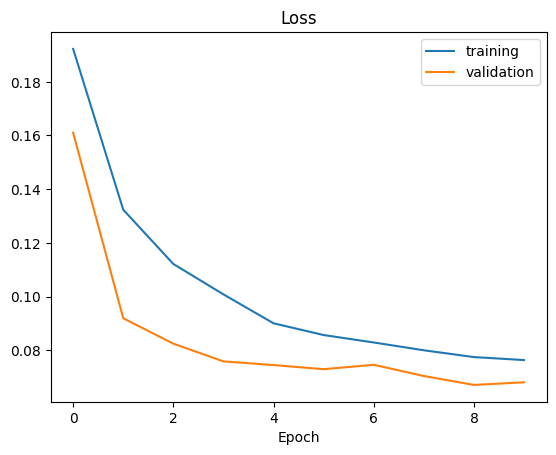

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')

In [ ]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>